# Chapter19 操作图像

## pillow模块

### 颜色和RGBA值

In [2]:
# 不要用这个
import PIL

In [3]:
# 而是用这个导入模块
from PIL import ImageColor
ImageColor.getcolor('red', 'RGBA')

(255, 0, 0, 255)

In [4]:
ImageColor.getcolor('white', 'RGBA')

(255, 255, 255, 255)

### 坐标和BOX元组

+ 以左上角的坐标为原点
+ 从左往右增加，从上往下增加
+ 用四个坐标的元组表示图像中的一个矩形区域
+ 分别是左上角坐标和右下角坐标

## 用pillow操作图像

### 图像打开，保存，属性，新建

In [5]:
from PIL import Image

In [6]:
catIm = Image.open('../zophie.png')

In [8]:
catIm.size

(816, 1088)

In [9]:
width, height = catIm.size

In [10]:
width

816

In [11]:
height

1088

In [12]:
catIm.filename

'../zophie.png'

In [13]:
catIm.format

'PNG'

In [14]:
catIm.format_description

'Portable network graphics'

In [15]:
catIm.get_format_mimetype

<bound method ImageFile.get_format_mimetype of <PIL.PngImagePlugin.PngImageFile image mode=RGB size=816x1088 at 0x1E6360C32D0>>

In [16]:
catIm.save('../zophie.jpg')

In [17]:
# 颜色模式、宽高元组、 背景颜色
im = Image.new('RGB',(100,200),'beige')

In [18]:
im.save('../beige_im.jpg')

In [19]:
im2 = Image.new('RGB',(100,200))

In [20]:
im2.save('../black_im.jpg')

### 剪裁图片

+ 剪裁crop()不会影响原图，它返回了一个新Image对象

In [22]:
cropped_im = catIm.crop((335,345,565,560))

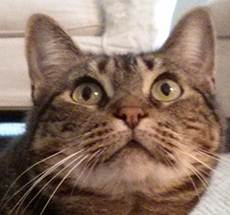

In [23]:
cropped_im

In [24]:
cropped_im.save('../cropped.jpg')

### 复制和粘贴图像到其他图像

In [25]:
cat_copy_im = catIm.copy()

In [26]:
face_im = catIm.crop((335,345,565,560))

In [27]:
face_im.size

(230, 215)

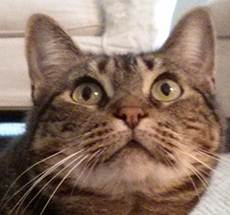

In [28]:
face_im

+ pasete()会影响原图，所以建议先拷贝一份，在拷贝的图像上做改变
+ paster(Image,box,mask)
+ box是位置元组
+ mask使用在粘贴图象是RGBA的情况，忽略透明部分

In [29]:
cat_copy_im.paste(face_im,(0,0))

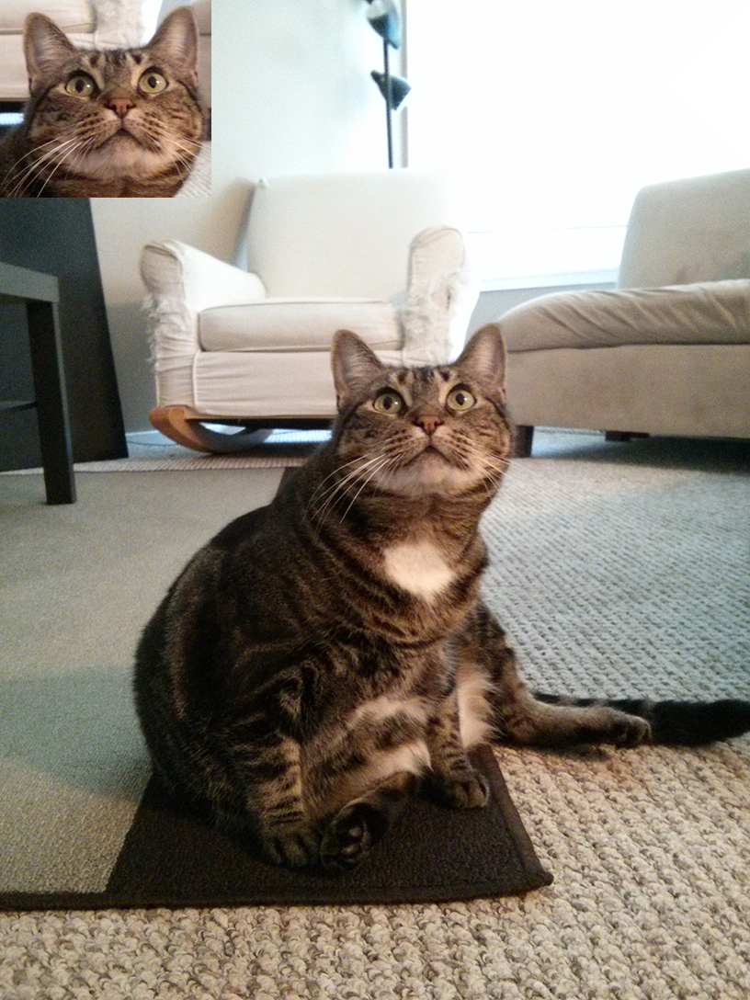

In [30]:
cat_copy_im

In [31]:
cat_copy_im.paste(face_im,(400,500))

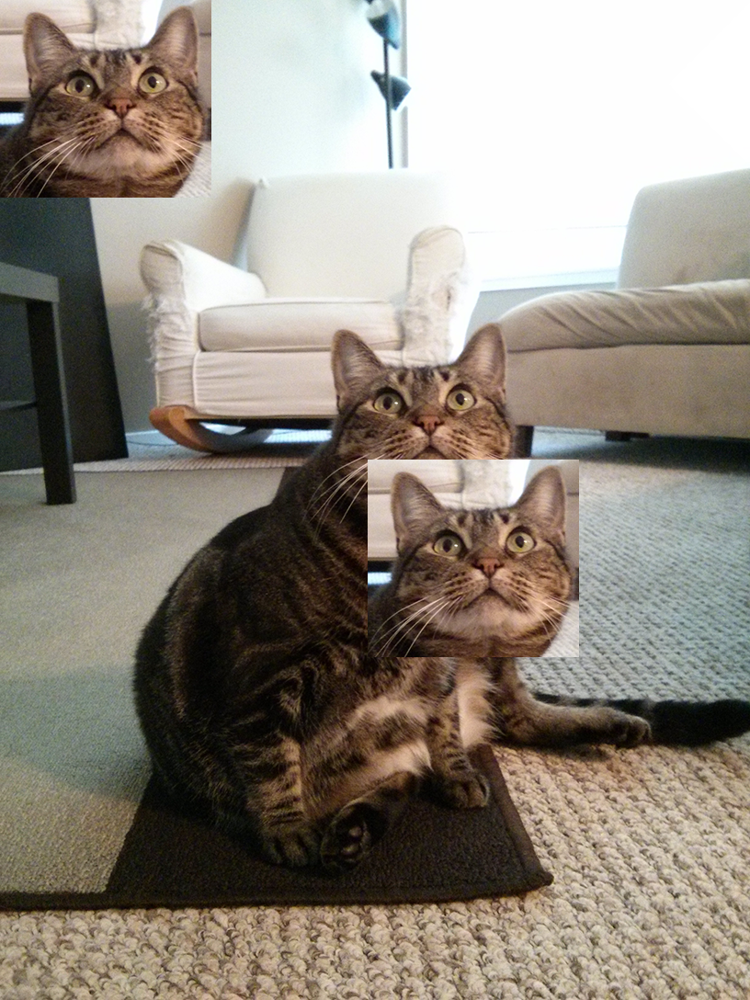

In [32]:
cat_copy_im

In [33]:
cat_copy_im.save('../pasted.jpg')

In [34]:
# 将猫猫头平铺整个原图

face_width, face_height = face_im.size
im_width, im_height = catIm.size

cat_copy2 = catIm.copy()

for i in range(0,im_width,face_width):
    for j in range(0,im_height,face_height):
        print(i,j)
        cat_copy2.paste(face_im,(i,j))

0 0
0 215
0 430
0 645
0 860
0 1075
230 0
230 215
230 430
230 645
230 860
230 1075
460 0
460 215
460 430
460 645
460 860
460 1075
690 0
690 215
690 430
690 645
690 860
690 1075


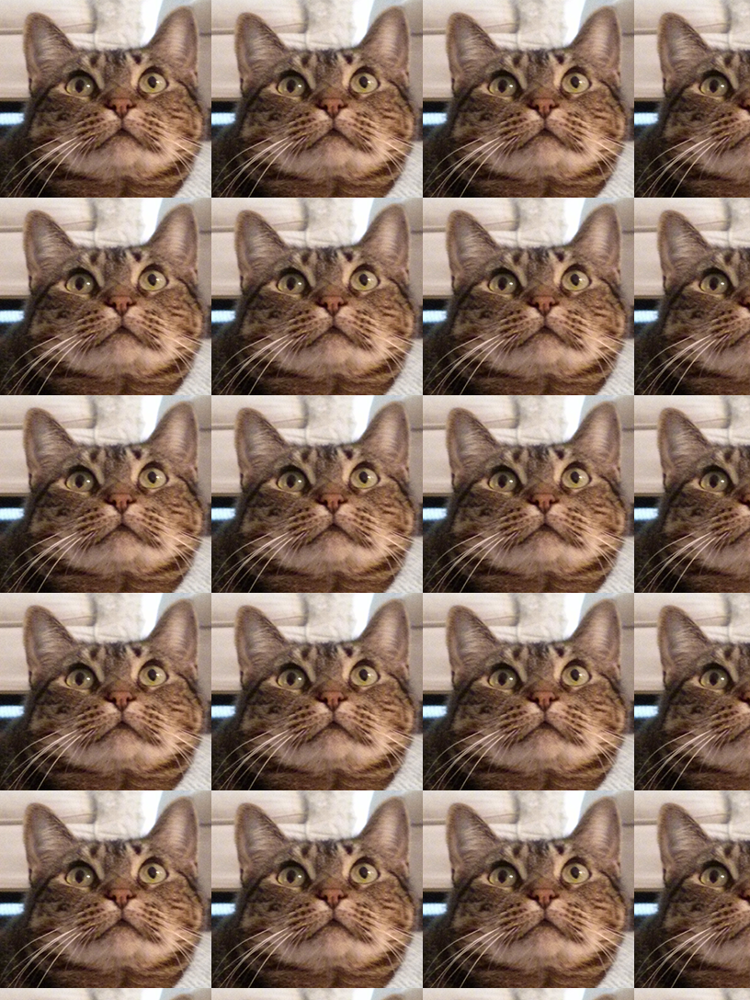

In [35]:
cat_copy2

In [36]:
cat_copy2.save('../mmt.jpg')

### 调整图像大小

+ resize()不会修改原图，而是返回一个新的Image对象

In [37]:
quartersized_im = catIm.resize((int(im_width/2), int(im_height/2)))

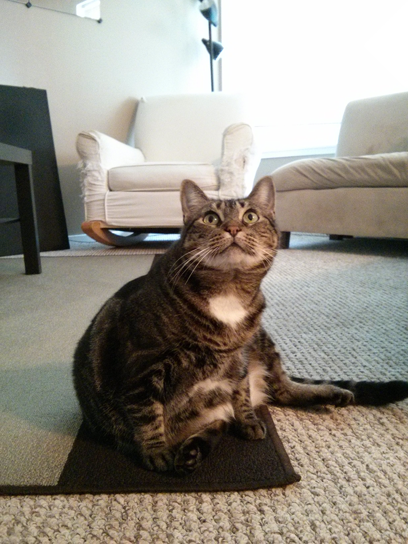

In [38]:
quartersized_im

In [39]:
quartersized_im.save('../quatersized.jpg')

In [42]:
slender_im = catIm.resize((im_width, im_height+200))

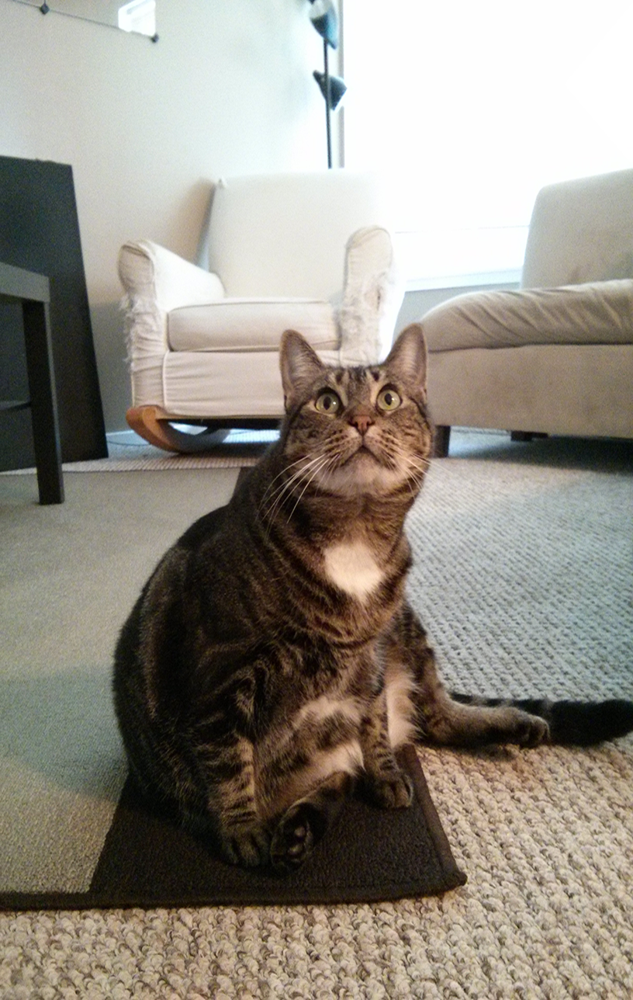

In [43]:
slender_im

In [44]:
slender_im.save('../slender.jpg')

### 旋转和翻转图像

+ 不会改变原图，返回新Image对象
+ 旋转是逆时针
+ 旋转后结果长宽跟原图一致
+ 关键字expand使得旋转结果适应

In [45]:
quartersized_im.rotate(90).save('../rotate90.jpg')

In [46]:
quartersized_im.rotate(180).save('../rotate180.jpg')
quartersized_im.rotate(270).save('../rotate270.jpg')

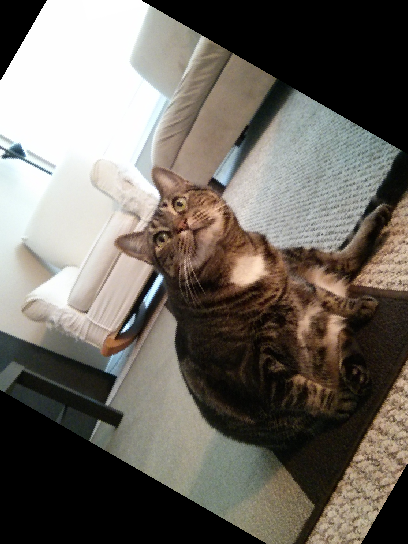

In [47]:
quartersized_im.rotate(60)

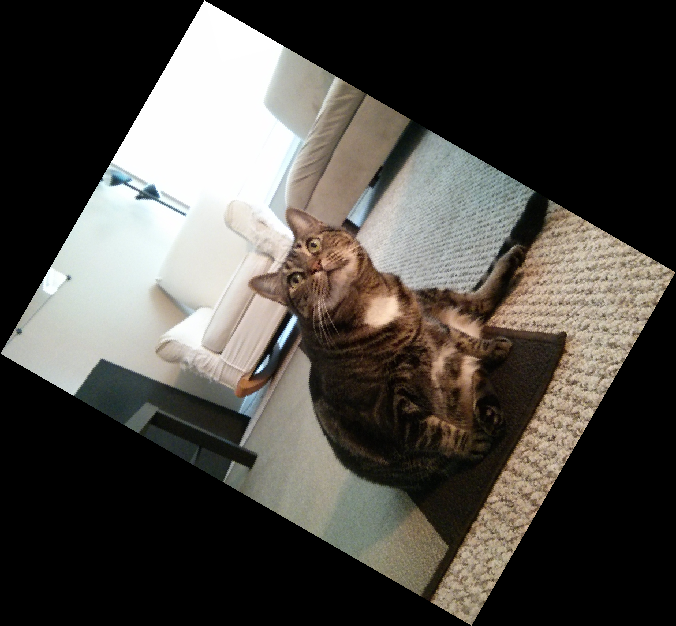

In [48]:
quartersized_im.rotate(60,expand=True)

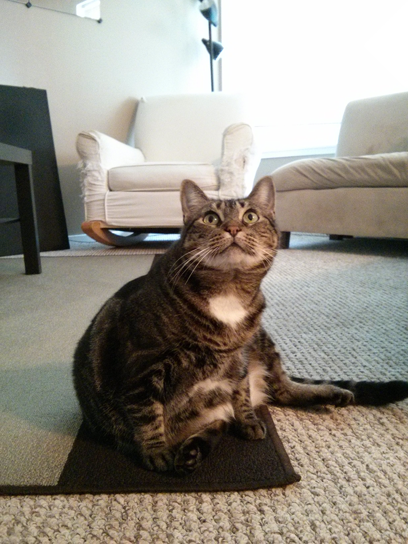

In [49]:
quartersized_im

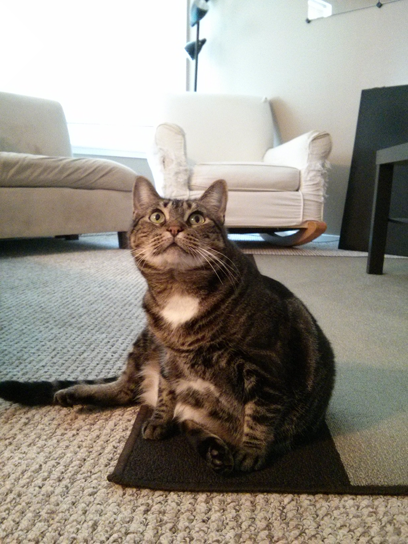

In [50]:
quartersized_im.transpose(Image.FLIP_LEFT_RIGHT)

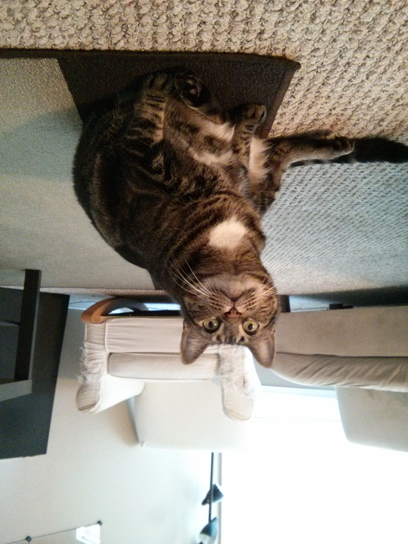

In [51]:
quartersized_im.transpose(Image.FLIP_TOP_BOTTOM)

### 更改单个像素

+ getpixel()和putpixel()取得和设置像素
+ get接受(x,y)元组，put多接受颜色的元组

In [52]:
im = Image.new('RGB',(100,100))

In [53]:
im.getpixel((0,0))

(0, 0, 0)

In [54]:
for x in range(0,100):
    for y in range(0,50):
        im.putpixel((x,y),(210,210,210))

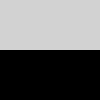

In [55]:
im

In [56]:
for x in range(0,100):
    for y in range(50,100):
        im.putpixel((x,y),ImageColor.getcolor('gold', 'RGB'))

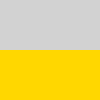

In [57]:
im

In [58]:
im.getpixel((51,52))

(255, 215, 0)

In [59]:
im.getpixel((11,12))

(210, 210, 210)

In [60]:
im.save('../putpixel.jpg')

## 项目：添加徽标

In [78]:
# resize_and_add_logo.py

from PIL import Image
import os


logo = Image.open('../../catlogo.png')
logo_width, logo_height = logo.size
logo = logo.resize((int(logo_width/8), int(logo_height/8)))

im_files_root = '../'
im_files = os.listdir(im_files_root)
new_im_files = '../result/' if os.path.exists('../result/') else os.mkdir('../result/')
for file in im_files:
    if file.endswith(('jpg','png','jpeg','PNG','JPG','JPEG')):
        file_path = os.path.join(im_files_root,file)
        im = Image.open(file_path)
        im_width, im_height = im.size
        if im_width >= im_height and im_width > 300:
            new_im = im.resize((300, int(im_height*300/im_width)))
        elif im_height > im_width and im_height > 300:
            new_im = im.resize((int(im_width*300/im_height),300))
        else:
            new_im = im.copy()
        new_im_width,new_im_height= new_im.size
        logo_width, logo_height = logo.size
        # 第三个位置的logo是mask
        new_im.paste(logo,(new_im_width-logo_width, new_im_height-logo_height),logo)
        new_im.save(os.path.join(new_im_files, file))
print('\033[1;32m程序完成\n¯\_(ツ)_/¯\033[0m')

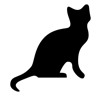

In [79]:
logo

In [82]:
logo.getchannel

<bound method Image.getchannel of <PIL.Image.Image image mode=RGBA size=101x96 at 0x1E63632B450>>

In [83]:
logo.mode

'RGBA'

## 在图象上绘画

### 绘制形状

In [84]:
from PIL import Image, ImageDraw

In [85]:
im = Image.new('RGB',(200,200), 'white')
draw = ImageDraw.Draw(im)

<font size=4>ImageDraw的形状</font>
+ point(xy,fill)
    + xy为元组列表或者非元组的列表
    + [(x,y),(x,y)...] or [x_1,y_1,x_2,y_2...]
    + fill是颜色，为RGBA元组或者颜色的字符串
+ line(xy,fill,width)
    + xy为元组列表或者非元组的列表
    + width默认为1
+ rectangle(xy,fill,outline)
    + xy形式为(left, top, right, bottom)
+ ellipse(xy,fill,outline)
    + xy形式为(left, top, right, bottom)
+ polygon(xy,fill,outline)
    + xy为元组列表或者非元组的列表

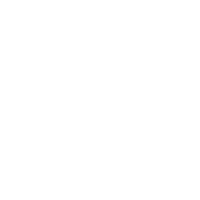

In [86]:
im

In [89]:
draw.line([0,1,23,5],'black',2)
draw.line([0,1,230,5],'black',2)

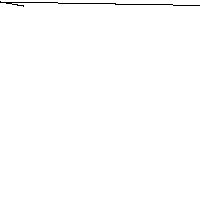

In [90]:
im

In [91]:
draw.ellipse((50,100,150,200),'orange')

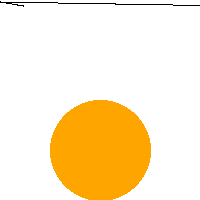

In [92]:
im

In [95]:
draw.rectangle((50,100,150,199),outline='pink')

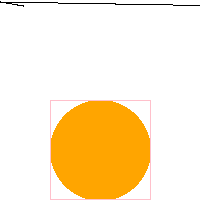

In [96]:
im

In [97]:
draw.polygon([1,1,55,55,33,133,199,199,1,199],outline='pink')

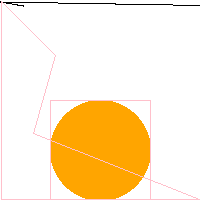

In [98]:
im

### 绘制文本

<font size=4>ImageDraw的text()方法</font>
+ xy, 文本区域的左上角
+ text，写入的文本
+ fill，文本颜色，可选
+ font，ImageFont对象，可选

textsize()方法：确定文本在某个字体下的大小，返回宽高的元组
+ text,要测量的文本
+ 可选的ImageFont对象

In [99]:
from PIL import Image,ImageDraw, ImageFont

In [100]:
import os

In [101]:
im= Image.new('RGBA',(200,200),'white')

In [104]:
draw = ImageDraw.Draw(im)

In [105]:
draw.text((50,50), 'hello', 'purple')
fonts_folder = 'C:\Windows\Fonts'
ITCBLKAD_font = ImageFont.truetype(os.path.join(fonts_folder, 'ITCBLKAD.TTF'), 32)
draw.text((100,150), 'Howdy', fill='gray', font=ITCBLKAD_font)

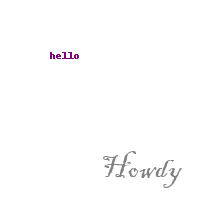

In [106]:
im

In [107]:
im.save('../text.png')

In [109]:
draw.textsize('howdy',ITCBLKAD_font)

C:\Users\DELL\AppData\Local\Temp\ipykernel_17096\3515234945.py:1: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  draw.textsize('howdy',ITCBLKAD_font)


(67, 38)

In [117]:
ITCBLKAD_font.getbbox('howdy')

(0, 8, 67, 38)

In [121]:
im2 = Image.new('RGBA',(100,100), 'white')

In [122]:
draw2 = ImageDraw.Draw(im2)
# textbbox不会去添加，而是返回文本在图上的左上和右下坐标
draw2.textbbox((30,30), 'Howdy', ITCBLKAD_font)

(30, 31, 112, 68)

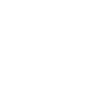

In [123]:
im2

In [124]:
ITCBLKAD_font.getbbox('Howdy')

(0, 1, 82, 38)

In [125]:
draw2.text((30,30),'Howdy',fill='gray', font=ITCBLKAD_font)

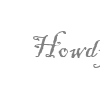

In [126]:
im2

## 实践项目...TODO

### 定制的座位卡

# Chapter20 用GUI自动化控制键盘和鼠标

## pyautogui模块

+ move(xoffset,yoffset): 在当前位置，移动多少距离
+ moveTo(x,y)： 移动到(x,y)这一点
+ drag(xoffset,yoffest)
+ dragTo(x,y)
+ click(x,y,button)
+ rightClick()
+ middleClick()
+ doubleClick()
+ mouseDown(x,y,button)
+ mouseUp(x,y,button)
+ scroll(units)
+ write(message)
+ write([key1,key2,...])
+ press(key)
+ KeyDown(key)
+ KeyUp(key)
+ hotkey([key1,key2,...], interval)
+ 窗口的四个函数

### 控制鼠标指针

+ 屏幕左上角为原点，向左向下递增

In [1]:
import pyautogui

In [2]:
wh = pyautogui.size()

In [3]:
wh

Size(width=1920, height=1080)

In [4]:
wh.width

1920

In [5]:
wh[0]

1920

In [7]:
for i in range(3):
    pyautogui.moveTo(100,100,duration=1)
    pyautogui.moveTo(200,100,duration=1)
    pyautogui.moveTo(300,100,duration=1)
    pyautogui.moveTo(400,100,duration=1)
    pyautogui.moveTo(500,100,duration=1)

In [8]:
pyautogui.position()

Point(x=935, y=876)

In [9]:
pyautogui.position()

Point(x=1919, y=0)

In [10]:
pyautogui.position()

Point(x=1919, y=1079)

### 控制鼠标交互

#### 单击鼠标

In [11]:
pyautogui.position()

Point(x=380, y=86)

In [25]:
pyautogui.click(380,86)

In [26]:
pyautogui.click(380,86, button='right')

#### 拖动鼠标

In [30]:
import time

time.sleep(5)
pyautogui.click()
distance = 300
change=20

while distance > 0:
    pyautogui.drag(distance,0,duration=0.2)
    distance -=change
    pyautogui.drag(0,distance,duration=0.2)
    # distance -=change
    pyautogui.drag(-distance,0,duration=0.2)
    distance -=change
    pyautogui.drag(0,-distance,duration=0.2)

#### 滚动鼠标

In [35]:
pyautogui.scroll(800)

### 规划鼠标运动

In [39]:
pyautogui.mouseInfo()

### 处理屏幕

#### 获取屏幕快照

In [40]:
im= pyautogui.screenshot()

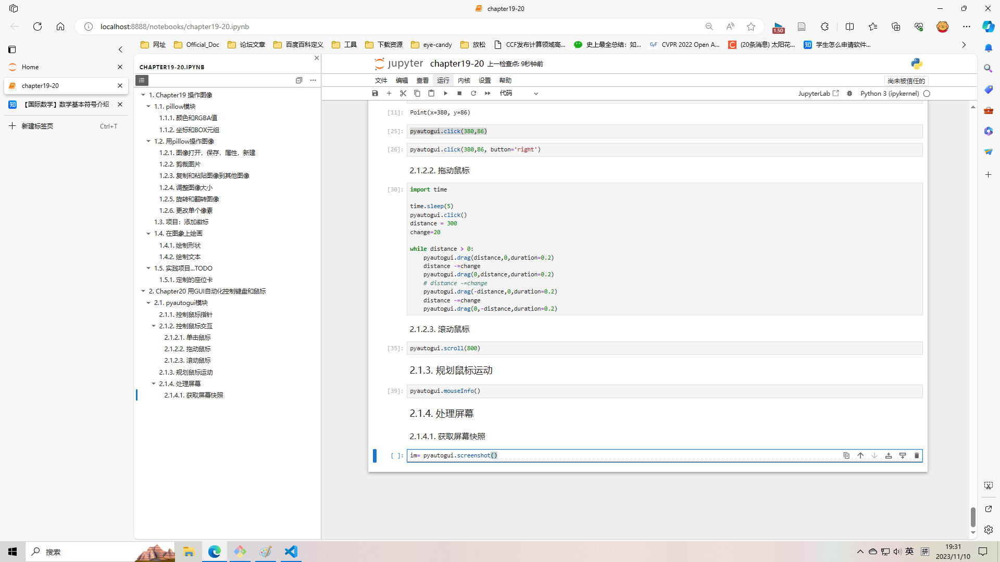

In [41]:
im

#### 分析屏幕快照

In [1]:
import pyautogui

In [2]:
pyautogui.size()

Size(width=1512, height=982)

In [2]:
pyautogui.pixel(x=10,y=233)

RGB(red=143, green=167, blue=196)

In [5]:
pyautogui.pixelMatchesColor(50, 200, (130, 135, 144))

False

In [6]:
pyautogui.position()

Point(x=363, y=639)

In [8]:
pyautogui.pixelMatchesColor(363,639,(255,255,255))

True

#### 图像识别

<font size=5>👇 error，try it on windows

In [9]:
b = pyautogui.locateOnScreen('../brush.jpg')

In [10]:
b

Box(left=1174, top=396, width=88, height=54)

In [11]:
pyautogui.position()

Point(x=605, y=207)

In [17]:
from PIL import Image

In [18]:
im = Image.open('../vscode.jpg')

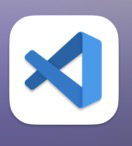

In [19]:
im

In [20]:
b2 = pyautogui.locateOnScreen(im)

In [21]:
b2

Box(left=736, top=1796, width=132, height=146)

<font size=5> This is on Windows</font>

In [1]:
import pyautogui

In [2]:
b= pyautogui.locateOnScreen('../webpage.png')

In [3]:
b

Box(left=1096, top=72, width=137, height=29)

In [7]:
pyautogui.mouseInfo()

In [5]:
b= pyautogui.locateOnScreen('../vscode.png')

In [6]:
b

Box(left=494, top=1043, width=37, height=36)

In [8]:
pyautogui.click('../vscode.png')

<font size=5> 合理怀疑是png和jpg图片格式问题</font>

#### 获取窗口信息

+ 仅适用于windows系统

In [9]:
fw = pyautogui.getActiveWindow()

In [10]:
fw

Win32Window(hWnd=263558)

In [11]:
str(fw)

'<Win32Window left="-8", top="-8", width="1936", height="1056", title="chapter19-20 和另外 2 个页面 - 个人 - Microsoft\u200b Edge">'

In [12]:
fw.title

'chapter19-20 和另外 2 个页面 - 个人 - Microsoft\u200b Edge'

In [13]:
fw.left

-8

In [14]:
fw.size

Size(width=1936, height=1056)

In [15]:
fw.left, fw.right, fw.top, fw.bottom

(-8, 1928, -8, 1048)

In [16]:
fw.area

2044416

In [18]:
pyautogui.click(fw.left+ 10, fw.top+20)

获取窗口的其他方法
+ getAllWindows()
+ getWindowsAt(x,y): 返回所有包含点(x,y)的Window对象列表
+ getWindowsWithTitle(title): ...
+ getActiveWindow()
+ getAllTitles()

返回的都是列表


In [19]:
pyautogui.getAllWindows()

[Win32Window(hWnd=65676),
 Win32Window(hWnd=263558),
 Win32Window(hWnd=132076),
 Win32Window(hWnd=1247828),
 Win32Window(hWnd=133830),
 Win32Window(hWnd=984310),
 Win32Window(hWnd=1181956),
 Win32Window(hWnd=1508130),
 Win32Window(hWnd=262540),
 Win32Window(hWnd=721324),
 Win32Window(hWnd=329910),
 Win32Window(hWnd=919616),
 Win32Window(hWnd=263606),
 Win32Window(hWnd=1246624),
 Win32Window(hWnd=264156),
 Win32Window(hWnd=67472),
 Win32Window(hWnd=198332),
 Win32Window(hWnd=526116),
 Win32Window(hWnd=394732),
 Win32Window(hWnd=67212),
 Win32Window(hWnd=132700),
 Win32Window(hWnd=67172),
 Win32Window(hWnd=197832),
 Win32Window(hWnd=131644),
 Win32Window(hWnd=132458),
 Win32Window(hWnd=197506),
 Win32Window(hWnd=65890),
 Win32Window(hWnd=65882),
 Win32Window(hWnd=65856),
 Win32Window(hWnd=65854),
 Win32Window(hWnd=131140),
 Win32Window(hWnd=394790),
 Win32Window(hWnd=132434),
 Win32Window(hWnd=132376),
 Win32Window(hWnd=132374),
 Win32Window(hWnd=132370),
 Win32Window(hWnd=263432),
 Win3

In [20]:
len(pyautogui.getAllWindows())

40

In [21]:
pyautogui.getAllTitles()

['',
 'chapter19-20 和另外 2 个页面 - 个人 - Microsoft\u200b Edge',
 '计算器',
 '',
 '(3) YouTube - Google Chrome',
 'Chrome109_AllNew_2023.5.17',
 'jupyter',
 'jupyter',
 'MINGW64:/d/Code/jupyter/automate_python',
 'Code',
 '日历',
 '日历',
 '邮件',
 '收件箱 - QQ \u200e- 邮件',
 '安装',
 'Cortana',
 'Cortana',
 '媒体播放器',
 '媒体播放器',
 '地图',
 '地图',
 '天气',
 '天气',
 '设置',
 '设置',
 '',
 '',
 '',
 '',
 '',
 'Microsoft Text Input Application',
 'DL.md - Typora',
 'C:\\Users\\DELL\\Documents\\Rainmeter\\Skins\\Appico\\Song Info\\Song Info.ini',
 'C:\\Users\\DELL\\Documents\\Rainmeter\\Skins\\Appico\\Visualiser\\Visualizer (Inverted).ini',
 'C:\\Users\\DELL\\Documents\\Rainmeter\\Skins\\Appico\\Day\\Day.ini',
 'C:\\Users\\DELL\\Documents\\Rainmeter\\Skins\\日历1.0\\Calendar1.0.ini',
 'C:\\Users\\DELL\\Documents\\Rainmeter\\Skins\\Elegance2\\Clock\\Clock_hori1.ini',
 'rmcsvheader.py - Code - Visual Studio Code',
 '',
 'Program Manager']

#### 操纵窗口

+ isMaximized
+ isMinimized
+ isActive
+ maximize()
+ minimize()
+ activate()
+ restore()  --> undoes a minimize/maximize action
+ close()

In [22]:
fw

Win32Window(hWnd=263558)

In [23]:
fw.isMaximized

True

In [24]:
fw.isMaximized

False

In [25]:
fw.isActive

True

In [26]:
fw.maximize()

In [28]:
fw.restore()

In [29]:
fw.minimize()

In [31]:
import time
time.sleep(5)
fw.activate()
# fw.close()

### 控制键盘

#### 发送字符，按键和快捷键

In [2]:
import pyautogui

In [3]:
pyautogui.position()

Point(x=874, y=936)

In [10]:
pyautogui.click(x=874,y=936)
pyautogui.write('hello world')
pyautogui.write(['enter'])

In [11]:
pyautogui.click(x=874,y=936)
pyautogui.keyDown('shift'); pyautogui.press('4'); pyautogui.keyUp('shift')

In [12]:
pyautogui.sleep(3)
pyautogui.countdown(10)

10 9 8 7 6 5 4 3 2 1 


In [34]:
pyautogui.press('volumeup')

In [33]:
pyautogui.press('volumemute')

In [50]:
# 没有指定interval导致不触发
pyautogui.hotkey('winright', 'd', interval=0.25)

In [48]:
# 触发失败
pyautogui.hotkey('winleft', 'd')

In [46]:
pyautogui.keyDown('winleft')
pyautogui.press('d')
pyautogui.keyUp('winleft')

## 项目：自动填表程序TODO

<font size=5>👆 failed on Chrome, try it on mac</font>

## 显示消息框

In [51]:
pyautogui.alert('this is a message', 'Important')

'OK'

In [52]:
pyautogui.confirm('do you want to continue?')

'Cancel'

In [53]:
pyautogui.prompt('what is your cat\'s name?')

'方法发'

In [54]:
pyautogui.password('what is your password?')

'hunter2'